## Assignment 07

1. Bagging vs Boosting

The scikit-learn library provides several options for bagging and boosting. It is possible to create your own boosting model based on a base model. For instance, you can create a tree based bagging model. In addition, scikit-learn provides AdaBoost. For XGBoost it is best to use the xgboost library.

Based on the theory in the accompanying notebook, create a bagging, boosting and dummy classifier. Test these classifiers on the breast cancer dataset. Go through the data science pipeline as you've done before:

Try to understand the dataset globally. Load the data. Exploratory analysis Preprocess data (skewness, normality, etc.) Modeling (cross-validation and training). (Create several bagging classifiers with different estimators.) Evaluation (Use the evaluation methods as described in the previous lessons. Then compare the different models.) Try to understand why some methods perform better than others. Try different configurations for your bagging and boosting models.

### import library

In [13]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.svm import SVC
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.datasets import make_classification
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

### load Data

In [4]:
df = pd.read_csv('D:/Data Science Class\Data science 3/my/data/breast-cancer.csv')
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


### Shape and info

In [5]:
df.shape

(569, 32)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [8]:
# Compute the count of each unique value in the 'diagnosis' column of the DataFrame 'df'
diagnosis_counts = df.diagnosis.value_counts()

# Display the frequency distribution of values in the 'diagnosis' column
# The unique values are shown as the index and their counts as the values
diagnosis_counts

B    357
M    212
Name: diagnosis, dtype: int64

### cleanning the Data

In [9]:
# Drop the 'id' column from the DataFrame 'df'
df = df.drop('id', axis=1)

# Replace the values in the 'diagnosis' column with numeric values
# 'B' is replaced with 0 and 'M' is replaced with 1
df['diagnosis'] = df['diagnosis'].replace({'B': 0, 'M': 1})

# Separate the features (X) and the target variable (y)
# X contains all columns except 'diagnosis'
X = df.drop('diagnosis', axis=1)

# y contains only the 'diagnosis' column as the target variable
y = df['diagnosis']

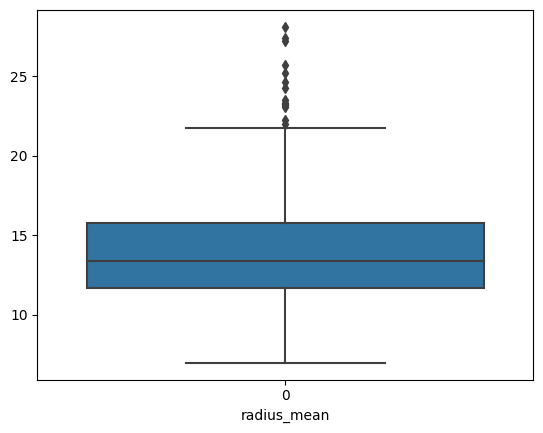

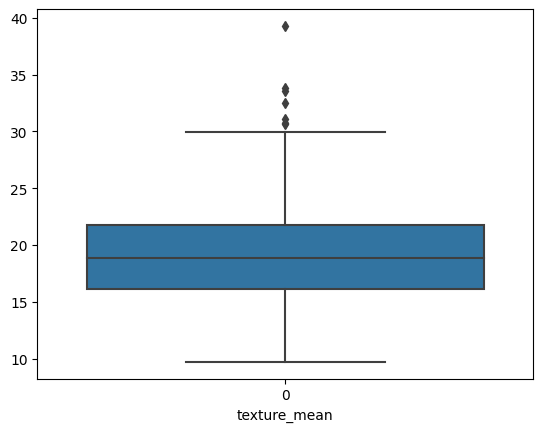

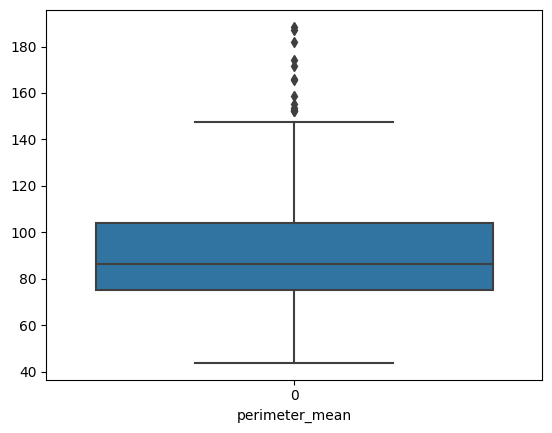

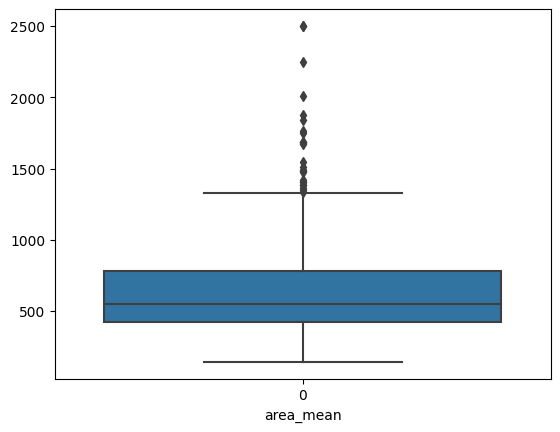

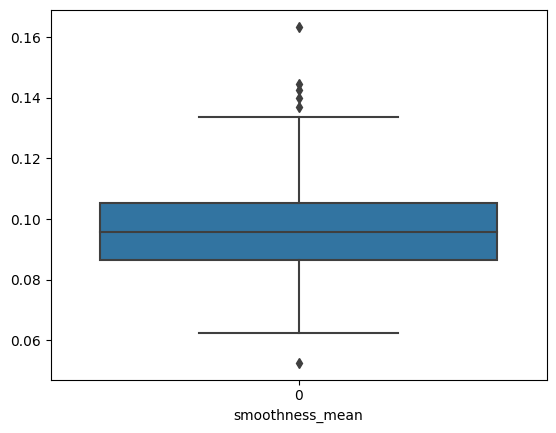

...

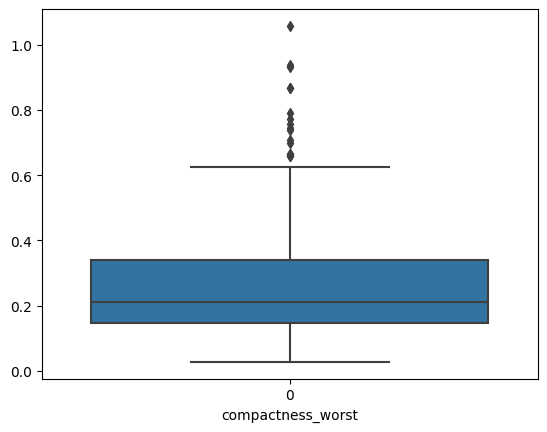

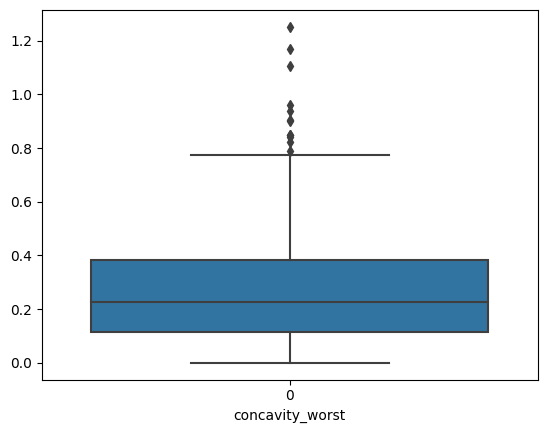

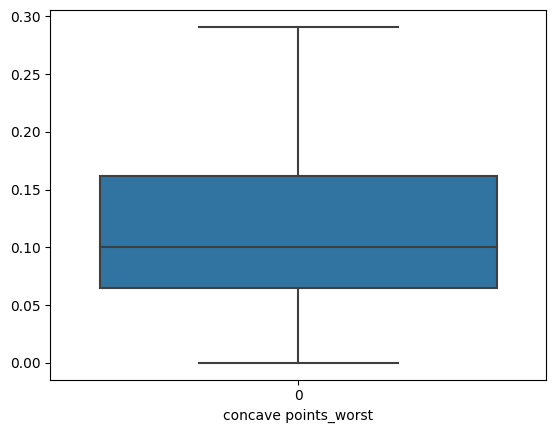

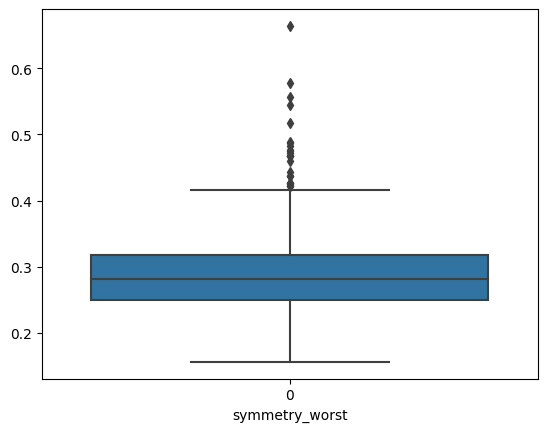

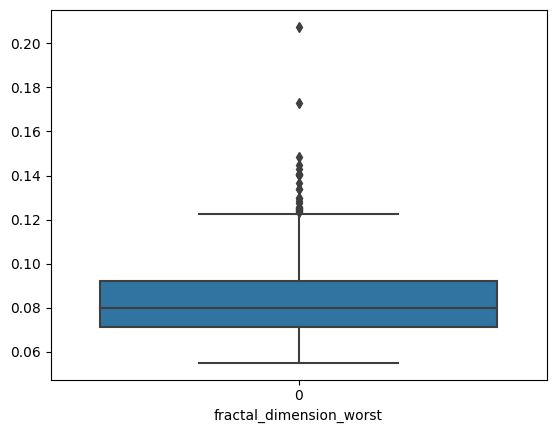

In [10]:
for c in X.columns:
    # Create a box plot for the current feature
    sns.boxplot(data=X[c])
    
    # Set x-axis label
    plt.xlabel(c)
    
    # Show the plot
    plt.show()

In [14]:

# Compute the correlation matrix
correlation_matrix = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Create a diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Create a correlation heatmap
plt.figure(figsize=(10, 8))
sns.pairplot(df)

# Set plot title
plt.title('Correlation pairplot')

# Display the plot
plt.show()

<Figure size 1000x800 with 0 Axes>

In [ ]:
# Standardize the feature matrix X using the StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

5) Modeling (cross-validation and training) and 6) Evaluation:

- bagging

In [16]:
X, y = make_classification(n_samples=100, n_features=10,
                          n_informative=5, n_redundant=2,
                          random_state=0, shuffle=True)

X_train, X_test, y_train, y_test = train_test_split(X, y)

estimators = [SVC(),KNeighborsClassifier(),DecisionTreeClassifier(),GaussianNB(),LogisticRegression()]
estimators_names =['KNN','Naive Bayes','Logistic Regression','Decision Tree','SVM',]


results = pd.DataFrame(columns=['estimators','accuracy'])

for i,estm in enumerate(estimators):
    clf = BaggingClassifier(estimator=estm, n_estimators=10, random_state=0)
    clf.fit(X_train, y_train)
    pred = clf.predict(X_test)
    acs = accuracy_score(y_test, pred)

    results.loc[i] = [estimators_names[i],acs]


results.head(10)




,estimators,accuracy
0,KNN,0.88
1,Naive Bayes,0.84
2,Logistic Regression,0.80
3,Decision Tree,0.84
4,SVM,0.80


SVMs have the potential to outperform decision trees in specific scenarios:

SVMs excel at handling non-linear decision boundaries through the utilization of various kernel functions, including polynomial or radial basis function (RBF) kernels.
SVMs tend to be more robust to noisy data compared to decision trees.
SVMs can effectively operate in high-dimensional spaces, making them suitable for tasks involving a large number of features.

- boosting

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

boosting_clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), random_state=42)

parameters_boosting = {
    'n_estimators': [100,120,150,170, 200],
    'learning_rate': [0.001, 0.01, 0.1, 1.0]
}

grid_search_boosting = GridSearchCV(boosting_clf, parameters_boosting, cv=5, scoring='f1')
grid_search_boosting.fit(X_train, y_train)

# Best parameters for Boosting
print("Best parameters for Boosting: ", grid_search_boosting.best_params_)
print("evaluation score: ", grid_search_boosting.best_score_)

Best parameters for Boosting:  {'learning_rate': 0.01, 'n_estimators': 150}
evaluation score:  0.8047985347985348


In this exercise, we trained the model once with the bagging method and with several different algorithms and displayed its results. As it is clear from the output, the SVM algorithm has the best result with an accuracy of 0.96.
In the second part, we trained the model using the boosting method and only with the decision tree algorithm. In this part, grid reach is used to get the best parameters for training the model. As a result, we reached an accuracy of 0.80.

In summary, Bagging and Boosting are both ensemble learning techniques used to improve the performance of machine learning models. In bagging, multiple instances of the same base model are trained on different subsets of the training data, generated through random sampling with replacement. These models are then combined by averaging (for regression) or majority voting (for classification) to create a final prediction that is more robust and less prone to overfitting. On the other hand, boosting focuses on sequentially training multiple instances of the base model, where each subsequent model gives more weight to the misclassified instances from the previous models. This allows boosting to correct errors over iterations and create a strong predictive model. While bagging reduces variance, boosting aims to decrease both bias and variance, often resulting in better predictive performance, but it can be more sensitive to noise in the data.